In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from climakitae.core.data_interface import (
    get_data,
)
from renewable_data_load import *

# import dask
# dask.config.set(scheduler='threads', num_workers=10)  # Adjust num_workers to your CPU cores

In [2]:
resource = "windpower"
module = "onshore"
domain = "d02"
variable = "cf"
frequency = "day"

future_gwl = 2.0
reference_gwl = 0.8

simulation = "mpi-esm1-2-hr"

simulations = ["mpi-esm1-2-hr", "miroc6", "taiesm1", 'ec-earth3',]


In [3]:
seasons = ['DJF', 'MAM', 'JJA', 'SON']

In [4]:
combos = [("pv", "utility",'d02'), ("windpower", "onshore",'d02'), ("windpower", "offshore",'d03')]

Processing Resource: pv, Module: utility, Simulation: mpi-esm1-2-hr
Processing Resource: pv, Module: utility, Simulation: miroc6
Processing Resource: pv, Module: utility, Simulation: taiesm1
Processing Resource: pv, Module: utility, Simulation: ec-earth3
Processing Resource: windpower, Module: onshore, Simulation: mpi-esm1-2-hr
Processing Resource: windpower, Module: onshore, Simulation: miroc6
Processing Resource: windpower, Module: onshore, Simulation: taiesm1
Processing Resource: windpower, Module: onshore, Simulation: ec-earth3
Processing Resource: windpower, Module: offshore, Simulation: mpi-esm1-2-hr
Processing Resource: windpower, Module: offshore, Simulation: miroc6
Processing Resource: windpower, Module: offshore, Simulation: taiesm1
Processing Resource: windpower, Module: offshore, Simulation: ec-earth3


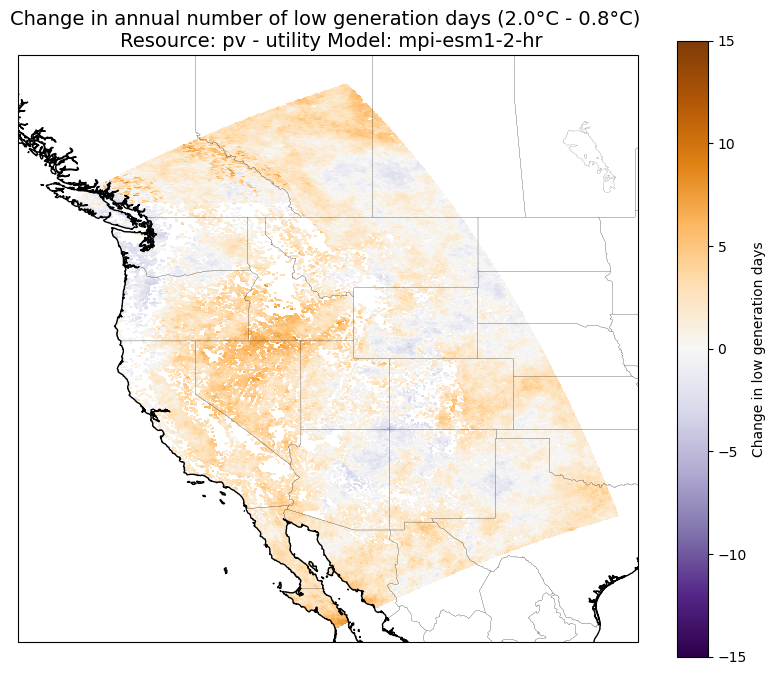

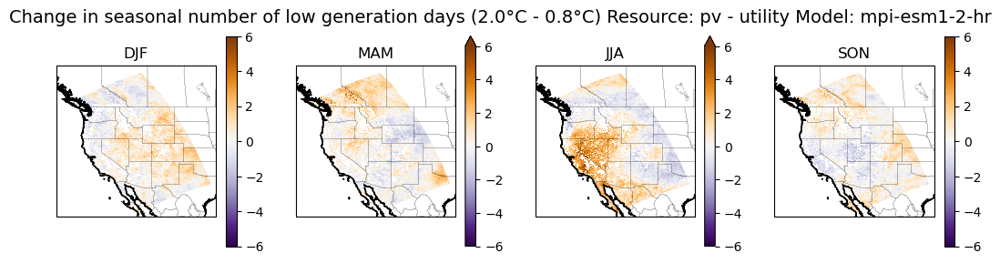

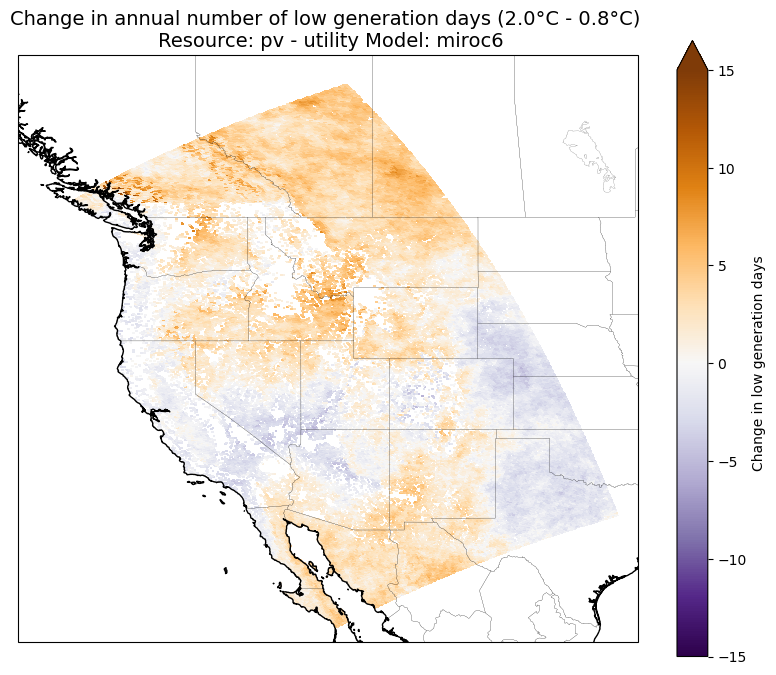

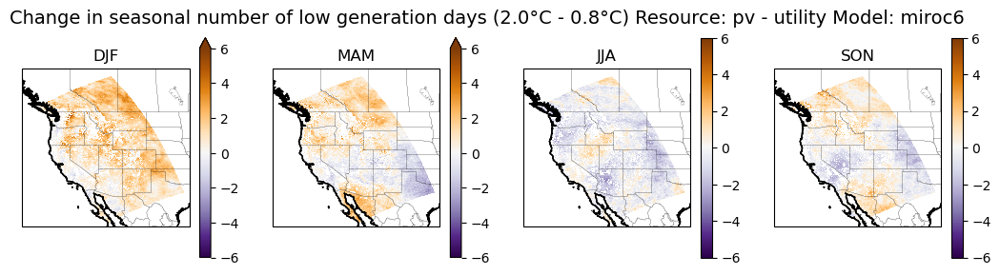

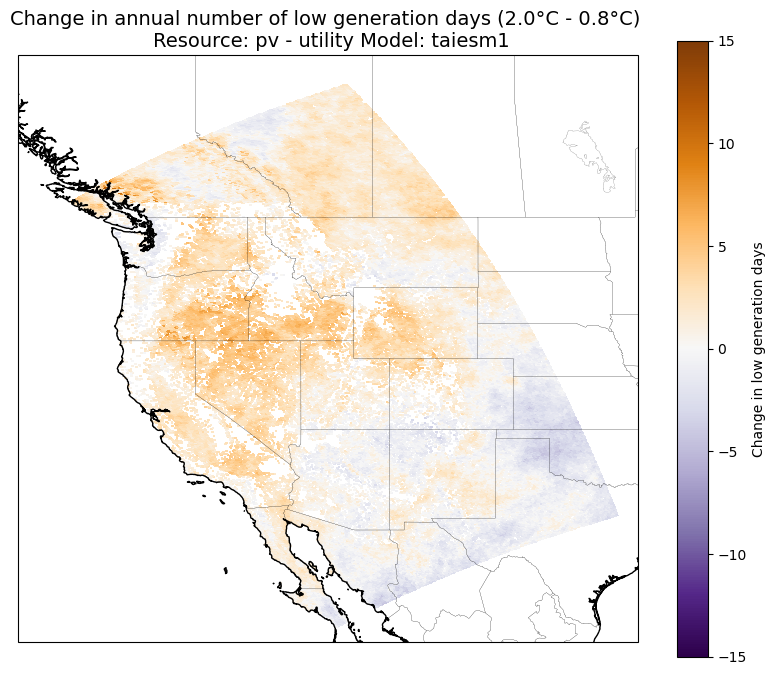

...

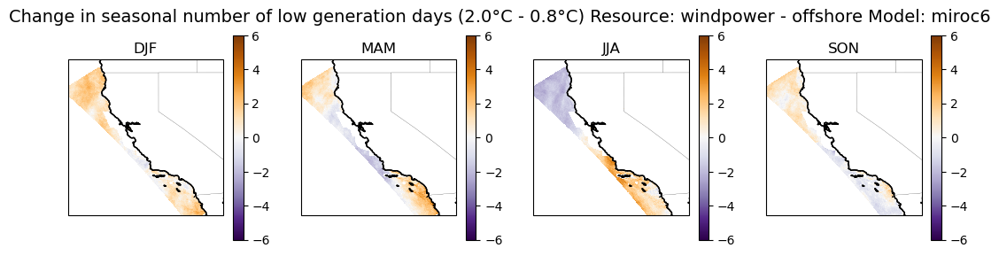

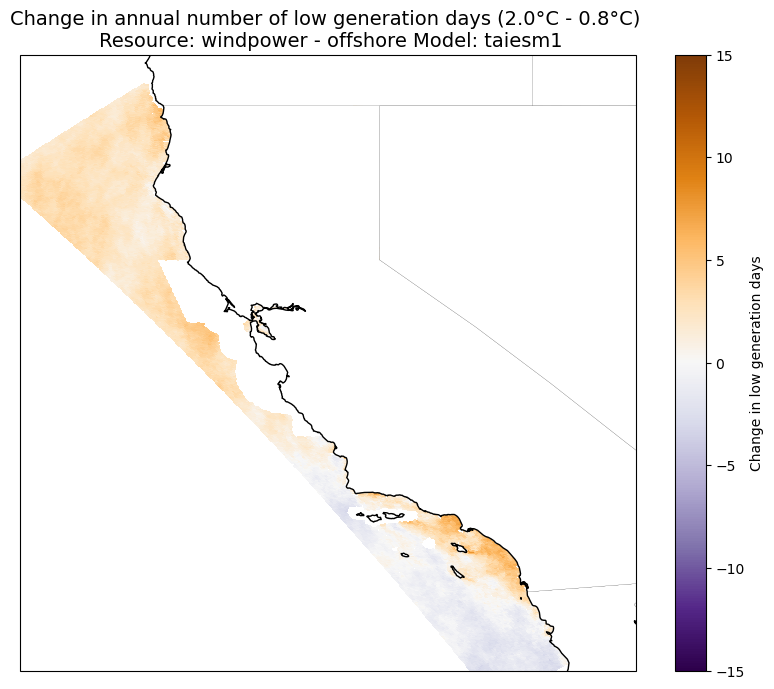

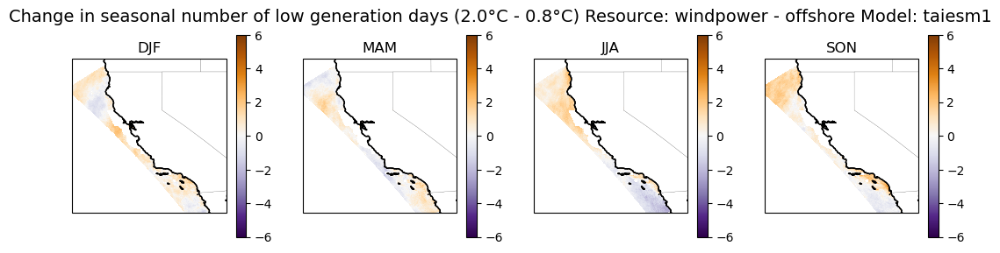

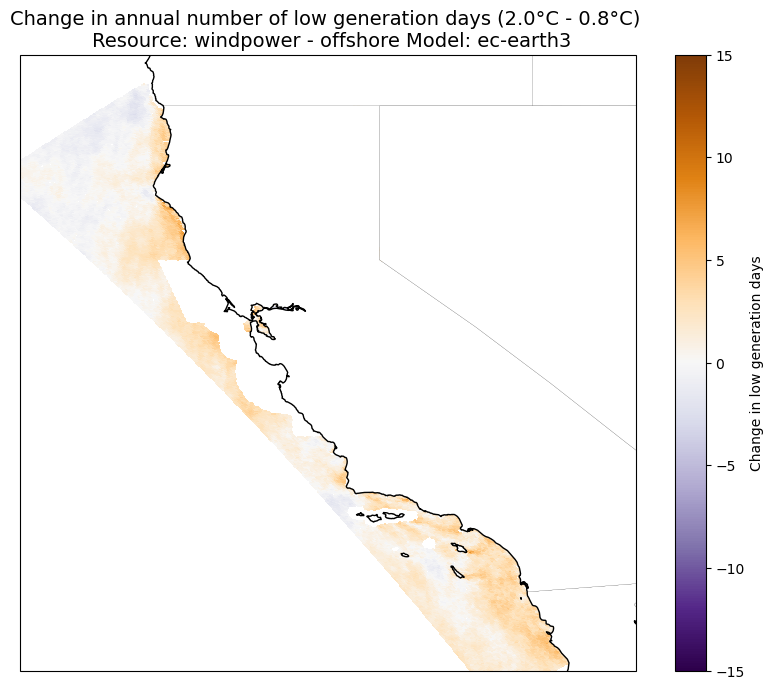

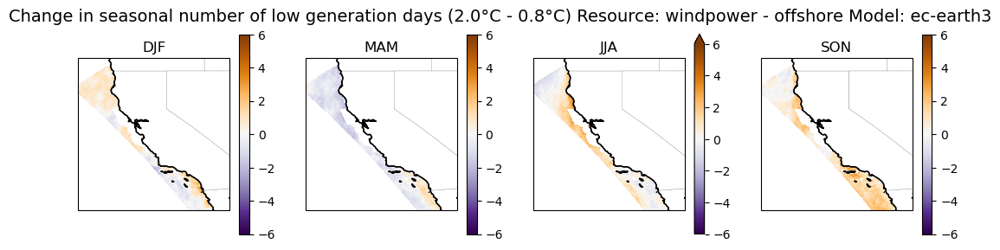

In [5]:
for resource, module, domain in combos:
    for simulation in simulations:

        print(f"Processing Resource: {resource}, Module: {module}, Simulation: {simulation}")
        fut_drought_stats_file = f"/Users/work/Code/renewable-analysis/data/drought_stats/{resource}_{module}_{domain}_{variable}_{simulation}_gwl2.0_drought_mask_metrics.nc"
        ref_drought_stats_file = f"/Users/work/Code/renewable-analysis/data/drought_stats/{resource}_{module}_{domain}_{variable}_{simulation}_gwl0.8_drought_mask_metrics.nc"

        # open zarr datasets
        ref_drought_stats = xr.open_zarr(ref_drought_stats_file, consolidated=True)
        fut_drought_stats = xr.open_zarr(fut_drought_stats_file, consolidated=True)

        ref_annual_days = ref_drought_stats.duration.resample(time='YE').sum(dim='time').mean(dim='time')
        fut_annual_days = fut_drought_stats.duration.resample(time='YE').sum(dim='time').mean(dim='time')
        delta_annual_mean = (fut_annual_days - ref_annual_days)
        delta_annual_mean = delta_annual_mean.where(delta_annual_mean != 0).compute()

        fut_seasonal_mean = fut_drought_stats.duration.resample(time='QS-DEC').sum().groupby('time.season').mean()
        ref_seasonal_mean = ref_drought_stats.duration.resample(time='QS-DEC').sum().groupby('time.season').mean()
        delta_seasonal_mean = fut_seasonal_mean - ref_seasonal_mean

        # set zeros to nan
        delta_seasonal_mean = delta_seasonal_mean.where(delta_seasonal_mean != 0).compute()


        fig = plt.figure(figsize=(10, 8))  # open matplotlib figure
        ax = plt.axes(projection=ccrs.PlateCarree())
        delta_annual_mean.plot(
            ax=ax,
            x="lon",
            y="lat",
            transform=ccrs.PlateCarree(),
            cbar_kwargs={"label": "Change in low generation days"},
            cmap="PuOr_r",
            vmin=-15,
            vmax=15
            )

        # Use tighter extent for offshore wind (d03 domain focused on CA coast)
        if resource == "windpower" and module == "offshore":
            ax.set_extent([-127, -115, 31, 43])
            ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1, facecolor='#FFFFFF')

        else:
            ax.set_extent([-130, -95, 25, 57])
            ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1)


        ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")

        plt.title(f"Change in annual number of low generation days (2.0°C - 0.8°C) \n Resource: {resource} - {module} Model: {simulation}", fontsize=14)
        plt.savefig(f"figures/large_scale_cf_change_{resource}_{module}_{future_gwl}C_minus_{reference_gwl}C_{simulation}_annual.png", dpi=300, bbox_inches='tight')

        fig, axes = plt.subplots(
            1, 4, figsize=(13, 3), subplot_kw={"projection": ccrs.PlateCarree()}
        )
        for ax, season in zip(axes.flatten(), seasons, strict=False):
            delta_seasonal_mean.sel(season=season).plot(
                ax=ax,
                x="lon",
                y="lat",
                transform=ccrs.PlateCarree(),
                cbar_kwargs={"label": None},
                cmap="PuOr_r",
                vmin=-6,
                vmax=6
            )
            ax.set_title(season)
            if resource == "windpower" and module == "offshore":
                ax.set_extent([-127, -115, 31, 43])
                ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1, facecolor='#FFFFFF')

            else:
                ax.set_extent([-130, -95, 25, 57])
                ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1)

            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")
        # set title
        # set title
        fig.suptitle(f"Change in seasonal number of low generation days (2.0°C - 0.8°C) Resource: {resource} - {module} Model: {simulation}", fontsize=14)
        plt.savefig(f"figures/large_scale_cf_change_{resource}_{module}_{future_gwl}C_minus_{reference_gwl}C_{simulation}_seasonal.png", dpi=300, bbox_inches='tight')



In [9]:
combos = [("windpower", "onshore",'d02'), ("windpower", "offshore",'d03')]

Processing Multi-Model Mean for Resource: windpower, Module: onshore
Processing Multi-Model Mean for Resource: windpower, Module: offshore


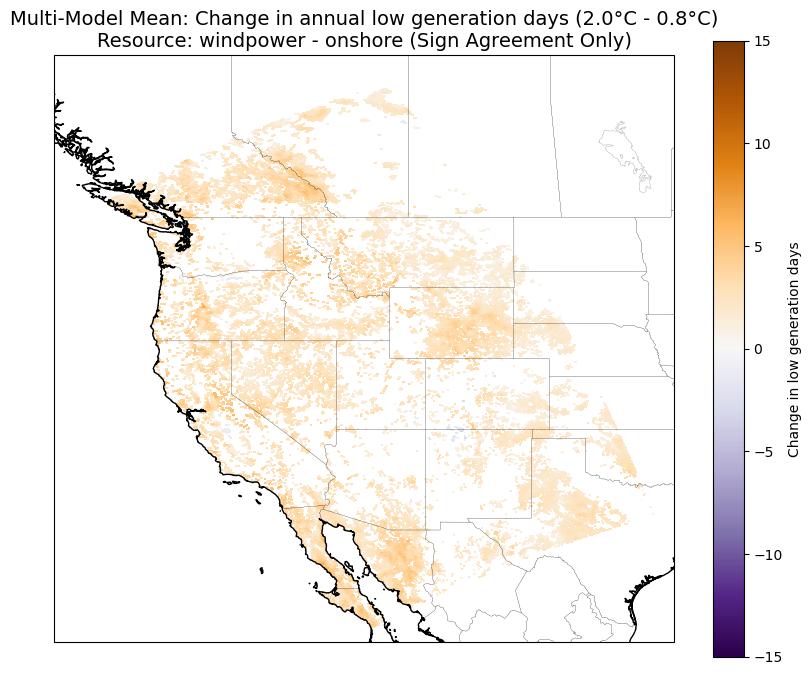

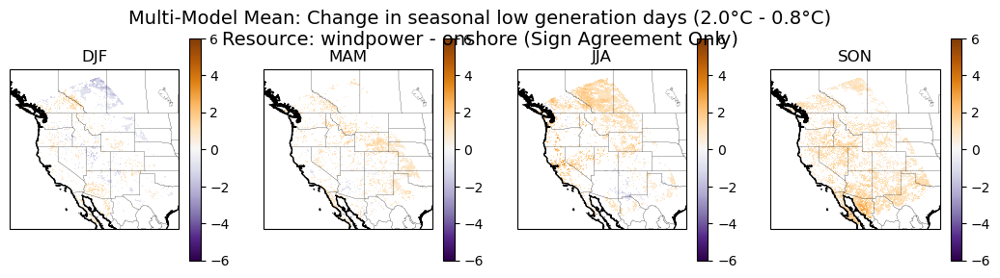

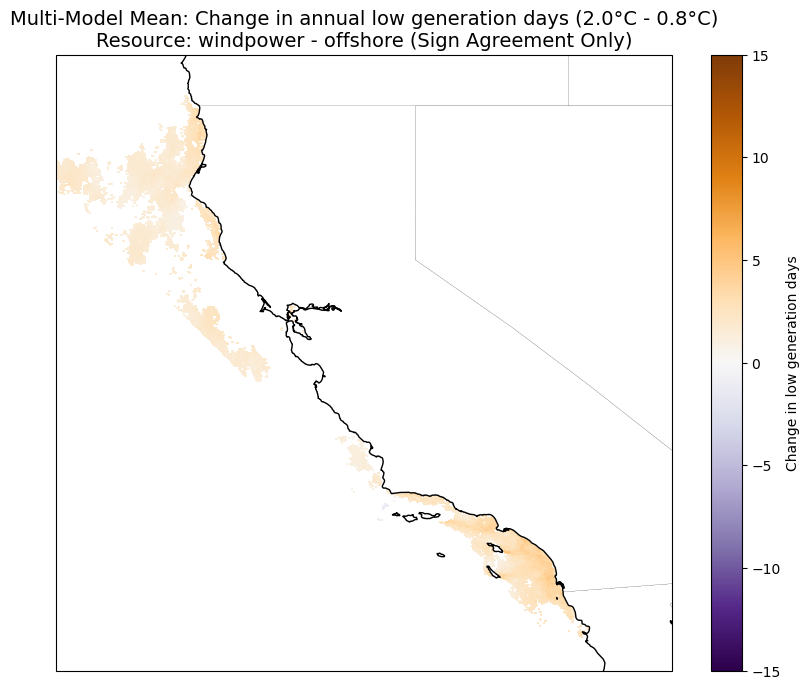

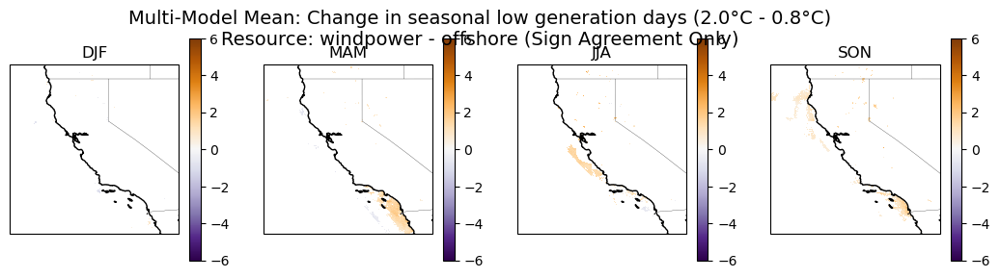

In [10]:
# Multi-model mean analysis with sign agreement mask
import numpy as np

for resource, module, domain in combos:
    print(f"Processing Multi-Model Mean for Resource: {resource}, Module: {module}")
    
    # Collect deltas from all simulations
    annual_deltas = []
    seasonal_deltas = []
    
    for simulation in simulations:
        fut_drought_stats_file = f"/Users/work/Code/renewable-analysis/data/drought_stats/{resource}_{module}_{domain}_{variable}_{simulation}_gwl2.0_drought_mask_metrics.nc"
        ref_drought_stats_file = f"/Users/work/Code/renewable-analysis/data/drought_stats/{resource}_{module}_{domain}_{variable}_{simulation}_gwl0.8_drought_mask_metrics.nc"
        
        # open zarr datasets
        ref_drought_stats = xr.open_zarr(ref_drought_stats_file, consolidated=True)
        fut_drought_stats = xr.open_zarr(fut_drought_stats_file, consolidated=True)
        
        # Annual
        ref_annual_days = ref_drought_stats.duration.resample(time='YE').sum(dim='time').mean(dim='time')
        fut_annual_days = fut_drought_stats.duration.resample(time='YE').sum(dim='time').mean(dim='time')
        delta_annual = (fut_annual_days - ref_annual_days).where(lambda x: x != 0)
        annual_deltas.append(delta_annual)
        
        # Seasonal
        fut_seasonal_mean = fut_drought_stats.duration.resample(time='QS-DEC').sum().groupby('time.season').mean()
        ref_seasonal_mean = ref_drought_stats.duration.resample(time='QS-DEC').sum().groupby('time.season').mean()
        delta_seasonal = (fut_seasonal_mean - ref_seasonal_mean).where(lambda x: x != 0)
        seasonal_deltas.append(delta_seasonal)
    
    # Stack all models along a new dimension and compute multi-model mean
    annual_stack = xr.concat(annual_deltas, dim='model')
    seasonal_stack = xr.concat(seasonal_deltas, dim='model')
    
    # Create sign agreement mask (all models have same sign)
    # This is True only where all models are positive OR all models are negative
    annual_all_positive = (annual_stack > 0).all(dim='model')
    annual_all_negative = (annual_stack < 0).all(dim='model')
    annual_sign_agreement = annual_all_positive | annual_all_negative
    
    seasonal_all_positive = (seasonal_stack > 0).all(dim='model')
    seasonal_all_negative = (seasonal_stack < 0).all(dim='model')
    seasonal_sign_agreement = seasonal_all_positive | seasonal_all_negative
    
    # Calculate multi-model mean
    mmm_annual = annual_stack.mean(dim='model')
    mmm_seasonal = seasonal_stack.mean(dim='model')
    
    # Apply sign agreement mask
    mmm_annual_masked = mmm_annual.where(annual_sign_agreement)
    mmm_seasonal_masked = mmm_seasonal.where(seasonal_sign_agreement)
    
    # Compute to load data
    mmm_annual_masked = mmm_annual_masked.compute()
    mmm_seasonal_masked = mmm_seasonal_masked.compute()
    
    # Plot annual multi-model mean
    fig = plt.figure(figsize=(10, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())
    mmm_annual_masked.plot(
        ax=ax,
        x="lon",
        y="lat",
        transform=ccrs.PlateCarree(),
        cbar_kwargs={"label": "Change in low generation days"},
        cmap="PuOr_r",
        vmin=-15,
        vmax=15
    )
    
    # Use tighter extent for offshore wind
    if resource == "windpower" and module == "offshore":
        ax.set_extent([-127, -115, 31, 43])
        ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1, facecolor='#FFFFFF')

    else:
        ax.set_extent([-130, -95, 25, 57])
        ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1)

    
    ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")
    
    plt.title(f"Multi-Model Mean: Change in annual low generation days (2.0°C - 0.8°C)\nResource: {resource} - {module} (Sign Agreement Only)", fontsize=14)
    plt.savefig(f"figures/large_scale_cf_change_{resource}_{module}_{future_gwl}C_minus_{reference_gwl}C_mmm_annual.png", dpi=300, bbox_inches='tight')
    
    # Plot seasonal multi-model mean
    fig, axes = plt.subplots(
        1, 4, figsize=(13, 3), subplot_kw={"projection": ccrs.PlateCarree()}
    )
    for ax, season in zip(axes.flatten(), seasons, strict=False):
        mmm_seasonal_masked.sel(season=season).plot(
            ax=ax,
            x="lon",
            y="lat",
            transform=ccrs.PlateCarree(),
            cbar_kwargs={"label": None},
            cmap="PuOr_r",
            vmin=-6,
            vmax=6
        )
        ax.set_title(season)
        if resource == "windpower" and module == "offshore":
            ax.set_extent([-127, -115, 31, 43])
        else:
            ax.set_extent([-130, -95, 25, 57])
        ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1)
        ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")
    
    fig.suptitle(f"Multi-Model Mean: Change in seasonal low generation days (2.0°C - 0.8°C)\nResource: {resource} - {module} (Sign Agreement Only)", fontsize=14)
    plt.savefig(f"figures/large_scale_cf_change_{resource}_{module}_{future_gwl}C_minus_{reference_gwl}C_mmm_seasonal.png", dpi=300, bbox_inches='tight')

Processing Resource: pv, Module: utility, Simulation: mpi-esm1-2-hr
Processing Resource: pv, Module: utility, Simulation: miroc6
Processing Resource: pv, Module: utility, Simulation: taiesm1
Processing Resource: pv, Module: utility, Simulation: ec-earth3
Processing Resource: windpower, Module: onshore, Simulation: mpi-esm1-2-hr
Processing Resource: windpower, Module: onshore, Simulation: miroc6
Processing Resource: windpower, Module: onshore, Simulation: taiesm1
Processing Resource: windpower, Module: onshore, Simulation: ec-earth3
Processing Resource: windpower, Module: offshore, Simulation: mpi-esm1-2-hr
Processing Resource: windpower, Module: offshore, Simulation: miroc6
Processing Resource: windpower, Module: offshore, Simulation: taiesm1
Processing Resource: windpower, Module: offshore, Simulation: ec-earth3


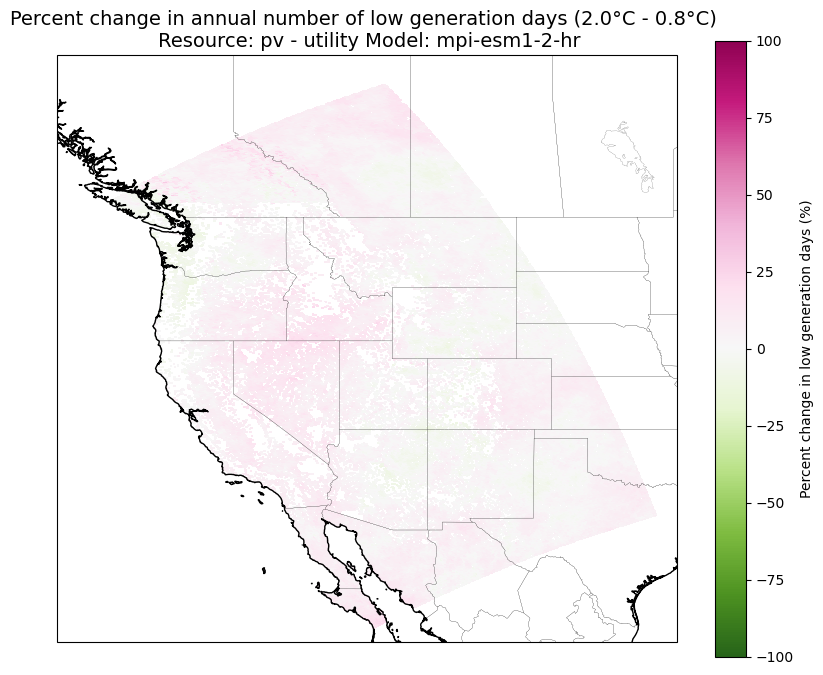

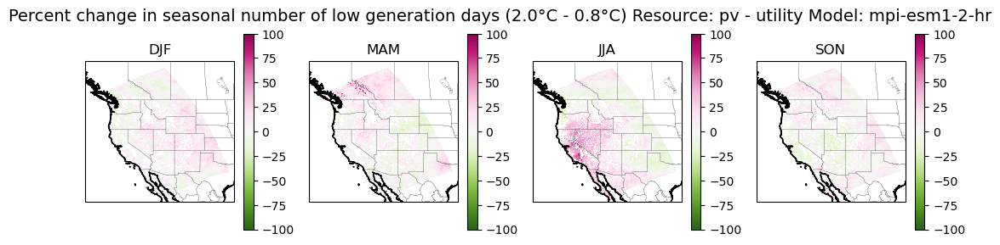

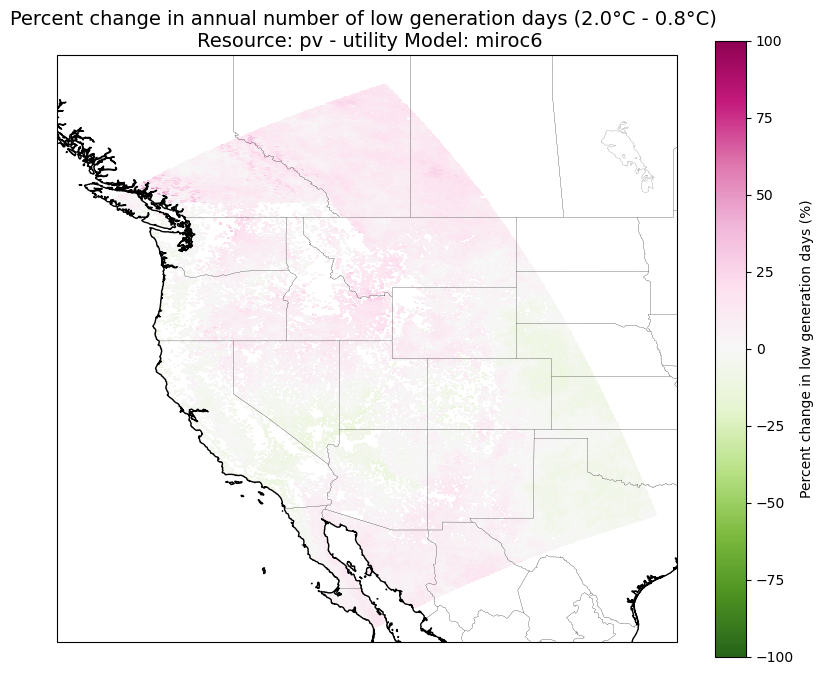

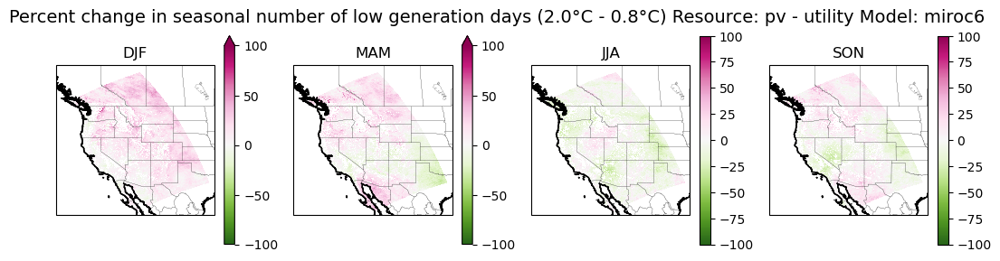

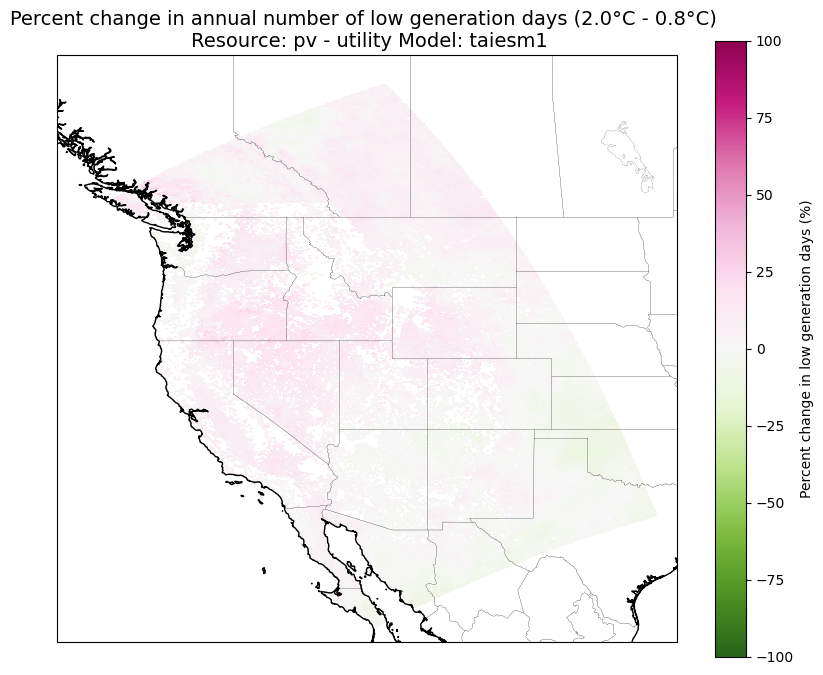

...

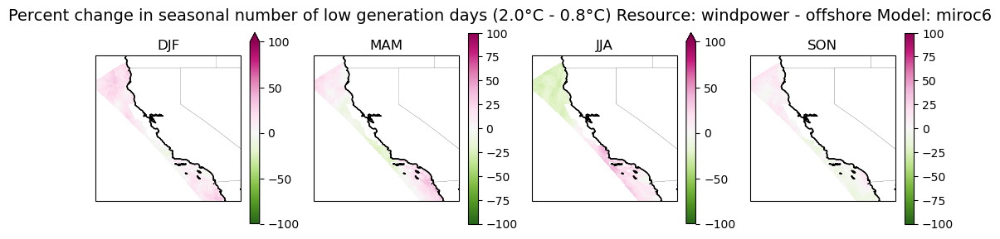

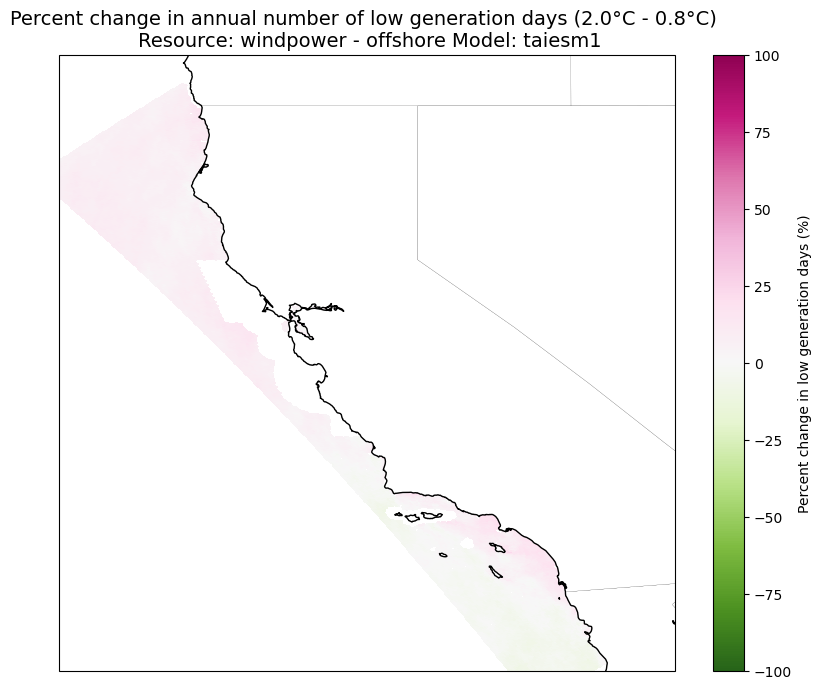

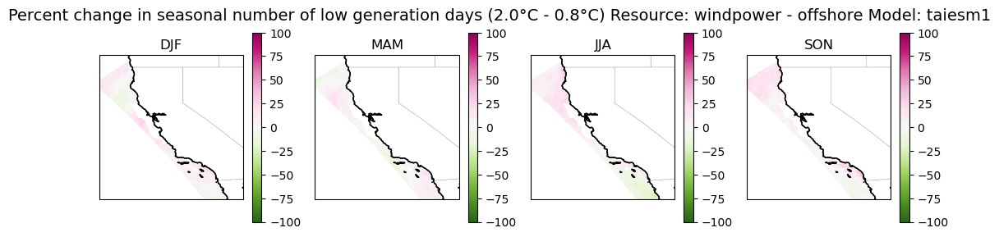

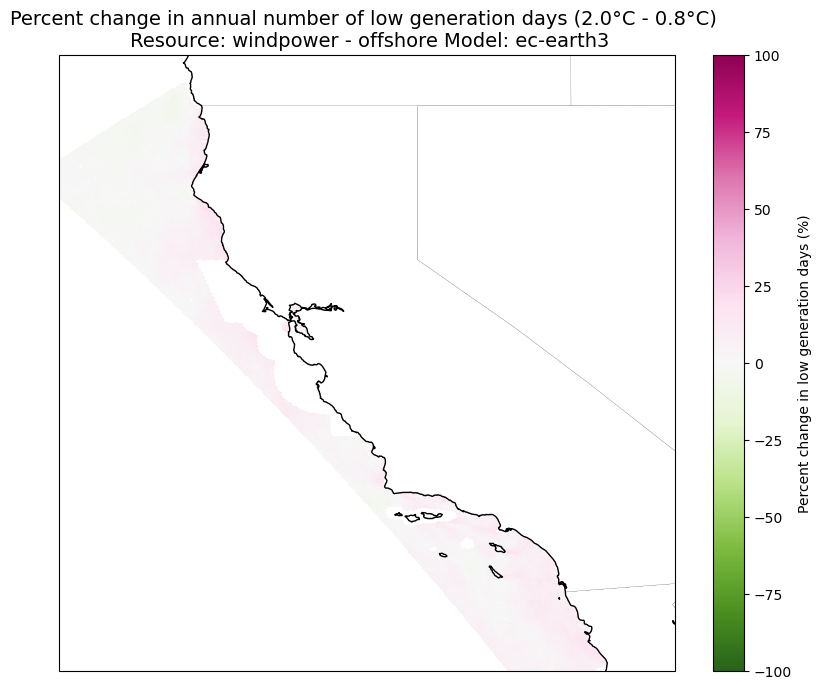

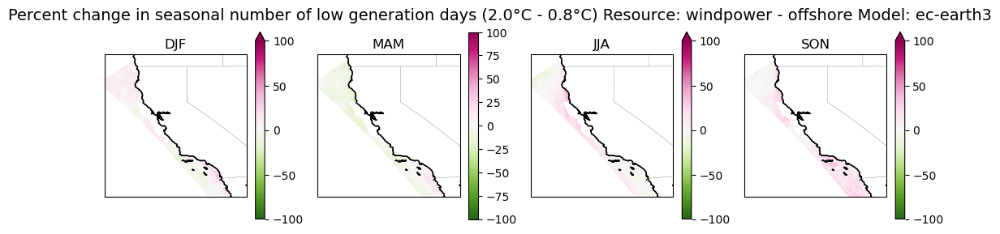

In [29]:
# now plot as percent change

for resource, module, domain in combos:
    for simulation in simulations:

        print(f"Processing Resource: {resource}, Module: {module}, Simulation: {simulation}")
        fut_drought_stats_file = f"/Users/work/Code/renewable-analysis/data/drought_stats/{resource}_{module}_{domain}_{variable}_{simulation}_gwl2.0_drought_mask_metrics.nc"
        ref_drought_stats_file = f"/Users/work/Code/renewable-analysis/data/drought_stats/{resource}_{module}_{domain}_{variable}_{simulation}_gwl0.8_drought_mask_metrics.nc"

        # open zarr datasets
        ref_drought_stats = xr.open_zarr(ref_drought_stats_file, consolidated=True)
        fut_drought_stats = xr.open_zarr(fut_drought_stats_file, consolidated=True)

        ref_annual_days = ref_drought_stats.duration.resample(time='YE').sum(dim='time').mean(dim='time')
        fut_annual_days = fut_drought_stats.duration.resample(time='YE').sum(dim='time').mean(dim='time')
        delta_annual_mean = ((fut_annual_days - ref_annual_days) / ref_annual_days) * 100
        delta_annual_mean = delta_annual_mean.where(delta_annual_mean != 0).compute()

        fut_seasonal_mean = fut_drought_stats.duration.resample(time='QS-DEC').sum().groupby('time.season').mean()
        ref_seasonal_mean = ref_drought_stats.duration.resample(time='QS-DEC').sum().groupby('time.season').mean()
        delta_seasonal_mean = ((fut_seasonal_mean - ref_seasonal_mean) / ref_seasonal_mean) * 100

        # set zeros to nan
        delta_seasonal_mean = delta_seasonal_mean.where(delta_seasonal_mean != 0).compute()


        fig = plt.figure(figsize=(10, 8))  # open matplotlib figure
        ax = plt.axes(projection=ccrs.PlateCarree())
        delta_annual_mean.plot(
            ax=ax,
            x="lon",
            y="lat",
            transform=ccrs.PlateCarree(),
            cbar_kwargs={"label": "Percent change in low generation days (%)"},
            cmap="PiYG_r",
            vmin=-100,
            vmax=100
            )

        # Use tighter extent for offshore wind (d03 domain focused on CA coast)
        if resource == "windpower" and module == "offshore":
            ax.set_extent([-127, -115, 31, 43])
            ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1, facecolor='#FFFFFF')

        else:
            ax.set_extent([-130, -95, 25, 57])
            ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1)


        ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")

        plt.title(f"Percent change in annual number of low generation days (2.0°C - 0.8°C) \n Resource: {resource} - {module} Model: {simulation}", fontsize=14)
        plt.savefig(f"figures/large_scale_cf_pct_change_{resource}_{module}_{future_gwl}C_minus_{reference_gwl}C_{simulation}_annual.png", dpi=300, bbox_inches='tight')

        fig, axes = plt.subplots(
            1, 4, figsize=(13, 3), subplot_kw={"projection": ccrs.PlateCarree()}
        )
        for ax, season in zip(axes.flatten(), seasons, strict=False):
            delta_seasonal_mean.sel(season=season).plot(
                ax=ax,
                x="lon",
                y="lat",
                transform=ccrs.PlateCarree(),
                cbar_kwargs={"label": None},
                cmap="PiYG_r",
                vmin=-100,
                vmax=100
            )
            ax.set_title(season)
            if resource == "windpower" and module == "offshore":
                ax.set_extent([-127, -115, 31, 43])
                ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1, facecolor='#FFFFFF')

            else:
                ax.set_extent([-130, -95, 25, 57])
                ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1)

            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")
        # set title
        # set title
        fig.suptitle(f"Percent change in seasonal number of low generation days (2.0°C - 0.8°C) Resource: {resource} - {module} Model: {simulation}", fontsize=14)
        plt.savefig(f"figures/large_scale_cf_pct_change_{resource}_{module}_{future_gwl}C_minus_{reference_gwl}C_{simulation}_seasonal.png", dpi=300, bbox_inches='tight')



In [13]:
# now plot drought Magnitude

combos = [("pv", "utility",'d02')]

Processing Resource: pv, Module: utility, Simulation: mpi-esm1-2-hr
Processing Resource: pv, Module: utility, Simulation: miroc6
Processing Resource: pv, Module: utility, Simulation: taiesm1
Processing Resource: pv, Module: utility, Simulation: ec-earth3


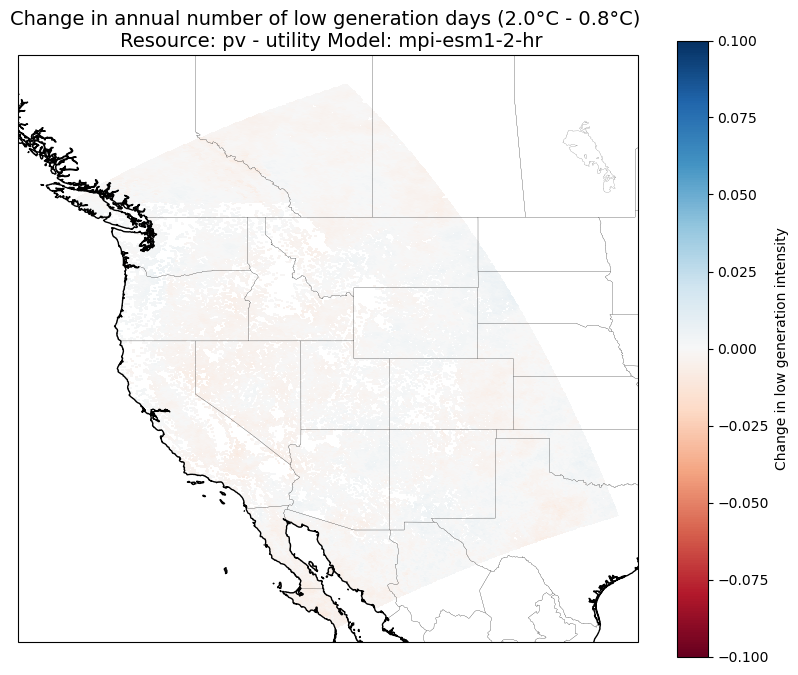

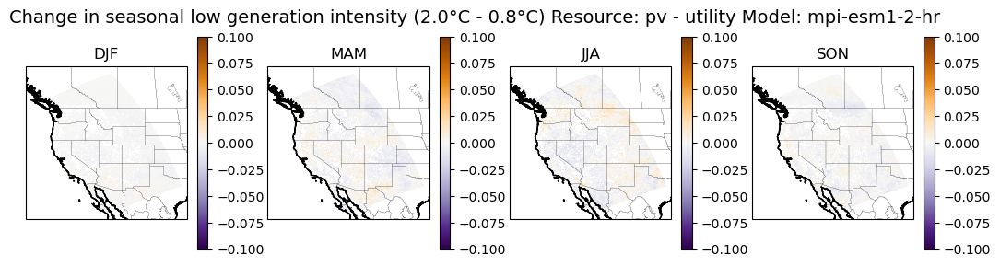

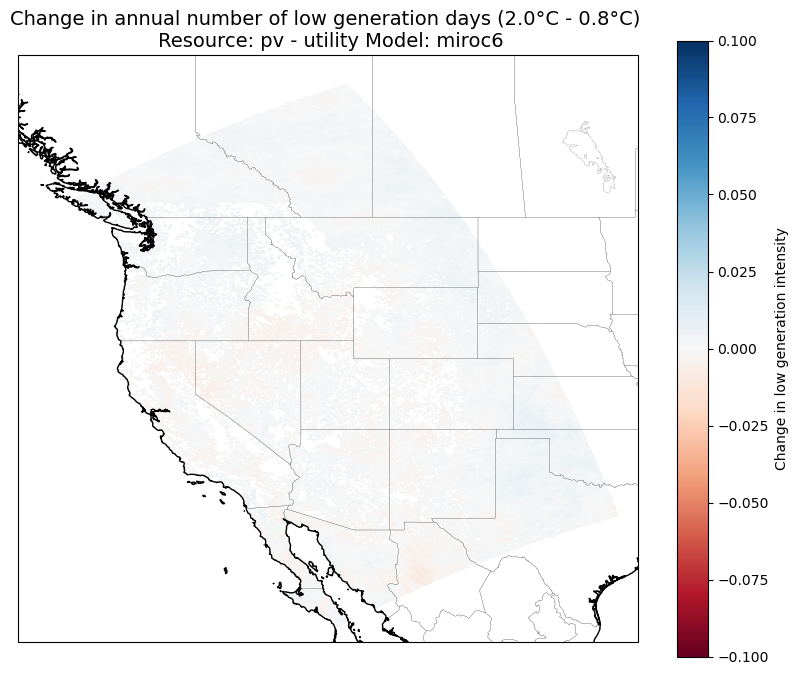

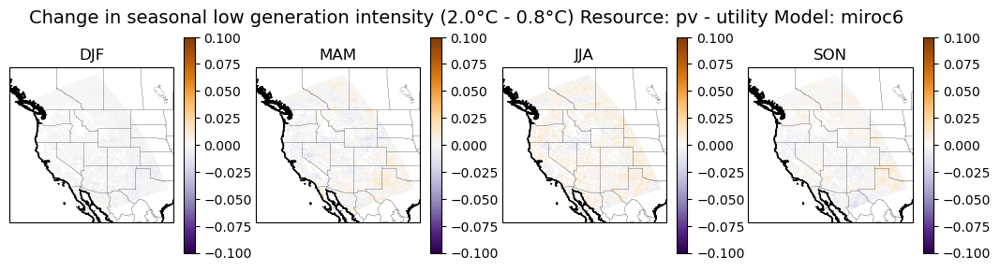

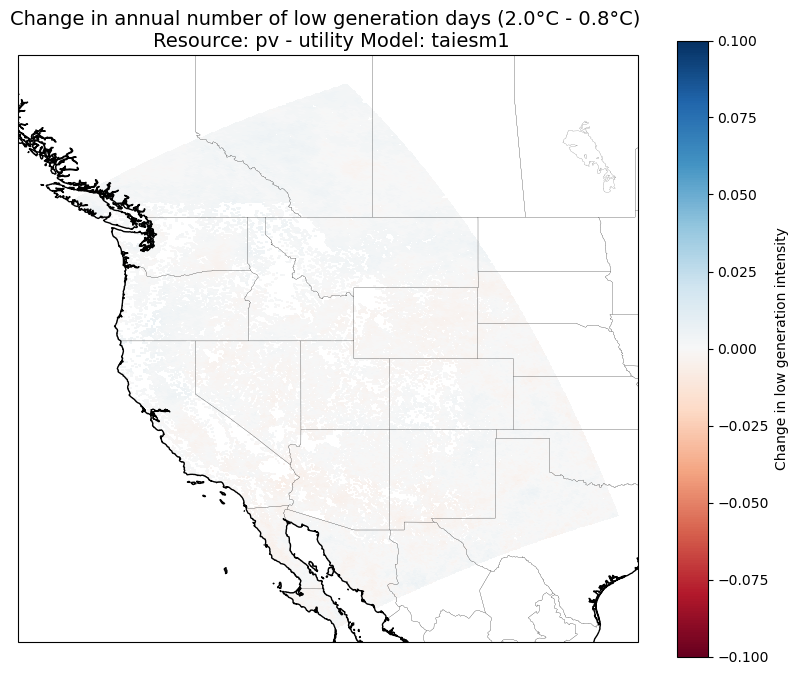

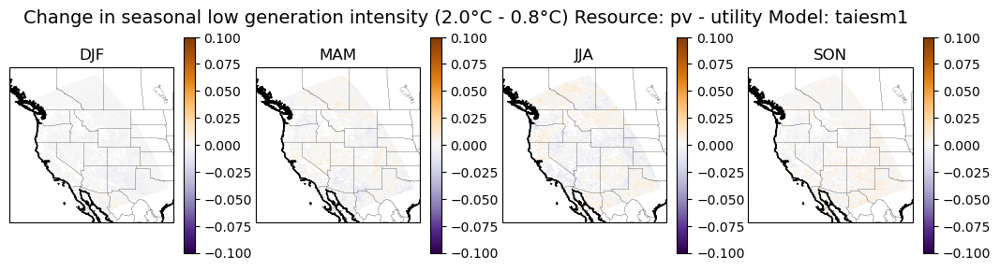

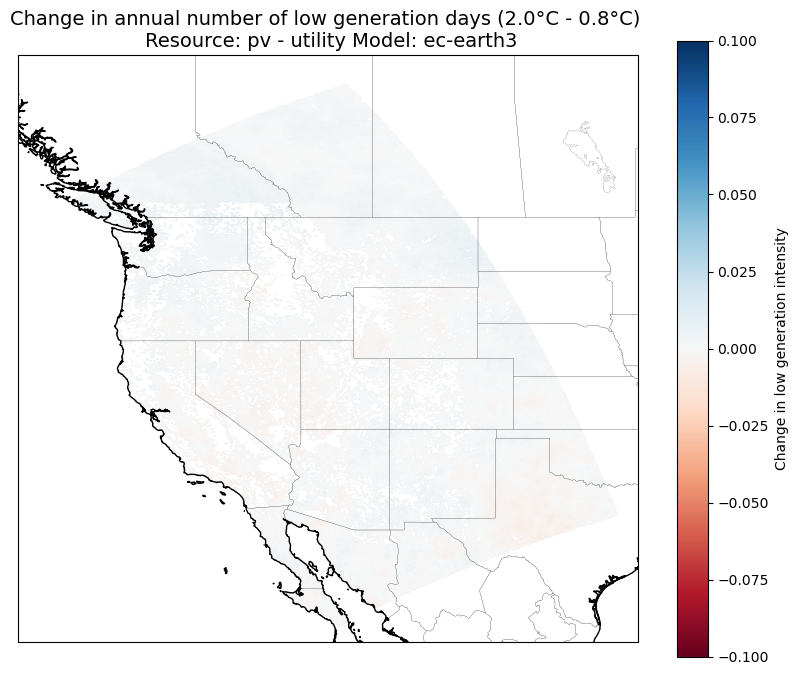

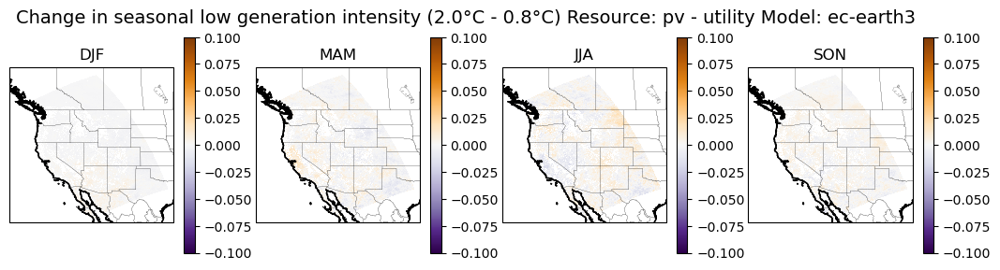

In [ ]:
for resource, module, domain in combos:
    for simulation in simulations:

            # Update title and colorbar label for intensity plots
        print(f"Processing Resource: {resource}, Module: {module}, Simulation: {simulation}")
        fut_drought_stats_file = f"/Users/work/Code/renewable-analysis/data/drought_stats/{resource}_{module}_{domain}_{variable}_{simulation}_gwl2.0_drought_mask_metrics.nc"
        ref_drought_stats_file = f"/Users/work/Code/renewable-analysis/data/drought_stats/{resource}_{module}_{domain}_{variable}_{simulation}_gwl0.8_drought_mask_metrics.nc"

        # open zarr datasets
        ref_drought_stats = xr.open_zarr(ref_drought_stats_file, consolidated=True)
        fut_drought_stats = xr.open_zarr(fut_drought_stats_file, consolidated=True)

        ref_annual_days = ref_drought_stats.intensity.resample(time='YE').mean(dim='time').mean(dim='time')
        fut_annual_days = fut_drought_stats.intensity.resample(time='YE').mean(dim='time').mean(dim='time')
        delta_annual_mean = (fut_annual_days - ref_annual_days)
        delta_annual_mean = delta_annual_mean.where(delta_annual_mean != 0).compute()

        fut_seasonal_mean = fut_drought_stats.intensity.resample(time='QS-DEC').mean().groupby('time.season').mean()
        ref_seasonal_mean = ref_drought_stats.intensity.resample(time='QS-DEC').mean().groupby('time.season').mean()
        delta_seasonal_mean = fut_seasonal_mean - ref_seasonal_mean

        # set zeros to nan
        delta_seasonal_mean = delta_seasonal_mean.where(delta_seasonal_mean != 0).compute()


        fig = plt.figure(figsize=(10, 8))  # open matplotlib figure
        ax = plt.axes(projection=ccrs.PlateCarree())
        delta_annual_mean.plot(
            ax=ax,
            x="lon",
            y="lat",
            transform=ccrs.PlateCarree(),
            cbar_kwargs={"label": "Change in low generation intensity (capacity factor)"},
            cmap="RdBu",
            vmin=-.05,
            vmax=.05
            )

        # Use tighter extent for offshore wind (d03 domain focused on CA coast)
        if resource == "windpower" and module == "offshore":
            ax.set_extent([-127, -115, 31, 43])
            ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1, facecolor='#FFFFFF')

        else:
            ax.set_extent([-130, -95, 25, 57])
            ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1)


        ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")

        plt.title(f"Change in low generation intensity (capacity factor) (2.0°C - 0.8°C) \n Resource: {resource} - {module} Model: {simulation}", fontsize=14)
        plt.savefig(f"figures/large_scale_cf_change_{resource}_{module}_{future_gwl}C_minus_{reference_gwl}C_{simulation}_annual.png", dpi=300, bbox_inches='tight')

        fig, axes = plt.subplots(
            1, 4, figsize=(13, 3), subplot_kw={"projection": ccrs.PlateCarree()}
        )
        for ax, season in zip(axes.flatten(), seasons, strict=False):
            delta_seasonal_mean.sel(season=season).plot(
                ax=ax,
                x="lon",
                y="lat",
                transform=ccrs.PlateCarree(),
                cbar_kwargs={"label": None},
                cmap="PuOr_r",
                vmin=-.05,
                vmax=.05
            )
            ax.set_title(season)
            if resource == "windpower" and module == "offshore":
                ax.set_extent([-127, -115, 31, 43])
                ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1, facecolor='#FFFFFF')

            else:
                ax.set_extent([-130, -95, 25, 57])
                ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="black", linewidth=0.1)

            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor="black")
        # set title
        # set title
        fig.suptitle(f"Change in seasonal low generation intensity (capacity factor) (2.0°C - 0.8°C) Resource: {resource} - {module} Model: {simulation}", fontsize=14)
        plt.savefig(f"figures/large_scale_cf_change_intensity_{resource}_{module}_{future_gwl}C_minus_{reference_gwl}C_{simulation}_seasonal.png", dpi=300, bbox_inches='tight')

